In [3]:
# Import for fetching data
import requests  
import json  

# Import for time-based operations
import time  
from datetime import datetime  

# Import for data processing
import pandas as pd  
import numpy as np  

# Import for visualization (when building the dashboard)
import matplotlib.pyplot as plt  
import seaborn as sns  


# Fetch and Print Raw Data

In [4]:


url = "http://localhost:1880/download"

try:
    while True:
        response = requests.get(url)
        if response.status_code == 200:
            data = response.json()
            print("\n✅ Raw Data Received:\n", data)  # Print real-time data
        else:
            print("❌ Error fetching data:", response.status_code)

        time.sleep(5)  # Reduce delay for faster updates

except KeyboardInterrupt:
    print("\n⏹️ Script stopped by user.")



✅ Raw Data Received:
 [{'_id': '67eae9087dc56e07d0ca7c66', 'payload': {'timestamp': '2025-03-31T19:12:08.266Z', 'energy_consumption_kWh': 128.39, 'voltage': 166.93}, '_msgid': '4c5b1846dad71925'}, {'_id': '67eae9037dc56e07d0ca7c65', 'payload': {'timestamp': '2025-03-31T19:12:03.264Z', 'energy_consumption_kWh': 538.69, 'voltage': 197.43}, '_msgid': 'd992d558cce06c1e'}, {'_id': '67eae8fe7dc56e07d0ca7c64', 'payload': {'timestamp': '2025-03-31T19:11:58.258Z', 'energy_consumption_kWh': 425.99, 'voltage': 217.03}, '_msgid': '26ce2ed5844740b9'}, {'_id': '67eae8f97dc56e07d0ca7c63', 'payload': {'timestamp': '2025-03-31T19:11:53.262Z', 'energy_consumption_kWh': 488.88, 'voltage': 194.51}, '_msgid': '8ad839655b134139'}, {'_id': '67eae8f47dc56e07d0ca7c62', 'payload': {'timestamp': '2025-03-31T19:11:48.254Z', 'energy_consumption_kWh': 254.38, 'voltage': 89.43}, '_msgid': '78f9705c8d5ffc52'}, {'_id': '67eae8ef7dc56e07d0ca7c61', 'payload': {'timestamp': '2025-03-31T19:11:43.248Z', 'energy_consumptio

#  Convert JSON to DataFrame


In [5]:
df = pd.DataFrame(data)

print("\n✅ Data Converted to DataFrame:\n", df.head())  # View first rows



✅ Data Converted to DataFrame:
                         _id  \
0  67eae9307dc56e07d0ca7c6e   
1  67eae92b7dc56e07d0ca7c6d   
2  67eae9267dc56e07d0ca7c6c   
3  67eae9217dc56e07d0ca7c6b   
4  67eae91c7dc56e07d0ca7c6a   

                                             payload            _msgid  
0  {'timestamp': '2025-03-31T19:12:48.282Z', 'ene...  ad51a4fa0d652402  
1  {'timestamp': '2025-03-31T19:12:43.279Z', 'ene...  57c510a667761b78  
2  {'timestamp': '2025-03-31T19:12:38.275Z', 'ene...  8dcbc3b42b4a6445  
3  {'timestamp': '2025-03-31T19:12:33.271Z', 'ene...  73999250e3c898b5  
4  {'timestamp': '2025-03-31T19:12:28.267Z', 'ene...  4958ab483f783560  


# Extract Relevant Data

In [6]:
if not df.empty:
    # Extract values from 'payload'
    df["timestamp"] = pd.to_datetime(df["payload"].apply(lambda x: x["timestamp"]))
    df["energy_consumption_kWh"] = df["payload"].apply(lambda x: float(x["energy_consumption_kWh"]))
    df["voltage"] = df["payload"].apply(lambda x: float(x["voltage"]))

    # Drop unnecessary columns
    df = df[["timestamp", "energy_consumption_kWh", "voltage"]]

# Print the first 5 rows to check
print(df.head())


                         timestamp  energy_consumption_kWh  voltage
0 2025-03-31 19:12:48.282000+00:00                  559.52    43.57
1 2025-03-31 19:12:43.279000+00:00                  122.48   161.50
2 2025-03-31 19:12:38.275000+00:00                  466.06   139.28
3 2025-03-31 19:12:33.271000+00:00                  384.73    54.20
4 2025-03-31 19:12:28.267000+00:00                  134.43    46.58


# Check Required Columns

In [7]:
required_columns = ["timestamp", "energy_consumption_kWh", "voltage"]

for col in required_columns:
    if col not in df.columns:
        print(f"❌ Missing Column: {col}")


# Convert Timestamp to Datetime

In [8]:
df["timestamp"] = pd.to_datetime(df["timestamp"])

print("\n✅ Converted Timestamp to Datetime:\n", df.head())



✅ Converted Timestamp to Datetime:
                          timestamp  energy_consumption_kWh  voltage
0 2025-03-31 19:12:48.282000+00:00                  559.52    43.57
1 2025-03-31 19:12:43.279000+00:00                  122.48   161.50
2 2025-03-31 19:12:38.275000+00:00                  466.06   139.28
3 2025-03-31 19:12:33.271000+00:00                  384.73    54.20
4 2025-03-31 19:12:28.267000+00:00                  134.43    46.58


#  Convert Energy & Voltage to Numeric

In [9]:
df["energy_consumption_kWh"] = pd.to_numeric(df["energy_consumption_kWh"], errors="coerce")
df["voltage"] = pd.to_numeric(df["voltage"], errors="coerce")

print("\n✅ Converted Energy and Voltage to Numeric:\n", df.head())



✅ Converted Energy and Voltage to Numeric:
                          timestamp  energy_consumption_kWh  voltage
0 2025-03-31 19:12:48.282000+00:00                  559.52    43.57
1 2025-03-31 19:12:43.279000+00:00                  122.48   161.50
2 2025-03-31 19:12:38.275000+00:00                  466.06   139.28
3 2025-03-31 19:12:33.271000+00:00                  384.73    54.20
4 2025-03-31 19:12:28.267000+00:00                  134.43    46.58


# Remove Invalid Values

In [10]:
df = df[(df["energy_consumption_kWh"] > 0) & (df["energy_consumption_kWh"] < 1000)]  # Example threshold
df = df[(df["voltage"] > 100) & (df["voltage"] < 300)]  # Example voltage range

print("\n✅ Removed Invalid Values:\n", df.head())



✅ Removed Invalid Values:
                          timestamp  energy_consumption_kWh  voltage
1 2025-03-31 19:12:43.279000+00:00                  122.48   161.50
2 2025-03-31 19:12:38.275000+00:00                  466.06   139.28
5 2025-03-31 19:12:23.268000+00:00                  528.59   219.39
6 2025-03-31 19:12:18.268000+00:00                  483.32   134.89
8 2025-03-31 19:12:08.266000+00:00                  128.39   166.93


# Drop Missing Values

In [11]:
df.dropna(inplace=True)

print("\n✅ Dropped Missing Values:\n", df.head())



✅ Dropped Missing Values:
                          timestamp  energy_consumption_kWh  voltage
1 2025-03-31 19:12:43.279000+00:00                  122.48   161.50
2 2025-03-31 19:12:38.275000+00:00                  466.06   139.28
5 2025-03-31 19:12:23.268000+00:00                  528.59   219.39
6 2025-03-31 19:12:18.268000+00:00                  483.32   134.89
8 2025-03-31 19:12:08.266000+00:00                  128.39   166.93


# DATA RESAMPLE

In [16]:

# Ensure timestamp is in datetime format
df["timestamp"] = pd.to_datetime(df["timestamp"])

# Sort by timestamp to maintain order
df = df.sort_values("timestamp")

# Resample data to show AVERAGE energy consumption per minute
df_resampled = df.resample("1T", on="timestamp").mean()

# Drop NaN values caused by resampling
df_resampled = df_resampled.dropna()

In [20]:

# Convert timestamp column to datetime
df["timestamp"] = pd.to_datetime(df["timestamp"], errors="coerce")

# If the timestamp is already timezone-aware, convert it to UTC
if df["timestamp"].dt.tz is not None:
    df["timestamp"] = df["timestamp"].dt.tz_convert("UTC")
else:
    # If timestamp is tz-naive, localize it to UTC
    df["timestamp"] = df["timestamp"].dt.tz_localize("UTC")

# Print DataFrame info to confirm changes
print(df.dtypes)
print(df.head())


timestamp                 datetime64[ns, UTC]
energy_consumption_kWh                float64
voltage                               float64
dtype: object
                            timestamp  energy_consumption_kWh  voltage
8728 2025-03-29 18:18:25.628000+00:00                  413.76   242.91
8727 2025-03-29 18:25:21.820000+00:00                  332.88   240.17
8725 2025-03-29 18:25:31.817000+00:00                  172.51   173.73
8724 2025-03-29 18:25:36.821000+00:00                  528.27   236.67
8723 2025-03-29 18:25:41.822000+00:00                  347.73   106.69


# Plot Energy Consumption Over Time


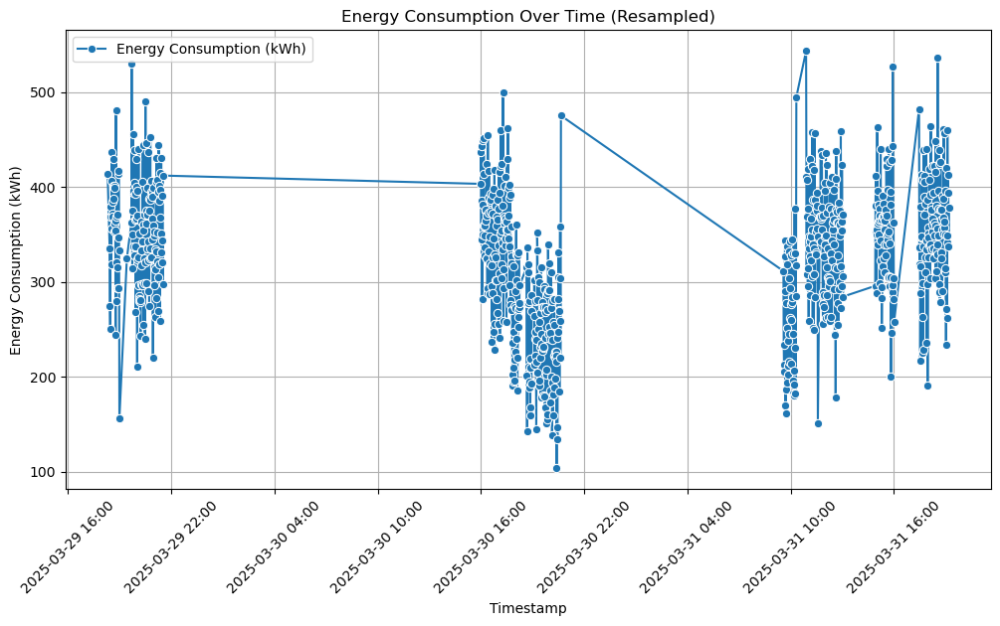

In [25]:
# Plot the resampled data
plt.figure(figsize=(12, 6))
sns.lineplot(x=df_resampled.index, y=df_resampled["energy_consumption_kWh"], marker="o", label="Energy Consumption (kWh)")

# Improve x-axis formatting
plt.xlabel("Timestamp")
plt.ylabel("Energy Consumption (kWh)")
plt.title("Energy Consumption Over Time (Resampled)")
plt.xticks(rotation=45)

# Format x-axis to show better time labels
plt.gca().xaxis.set_major_formatter(plt.matplotlib.dates.DateFormatter('%Y-%m-%d %H:%M'))  # Custom format
plt.gca().xaxis.set_major_locator(plt.matplotlib.dates.HourLocator(interval=6))  # Show every 6 hours
plt.legend()
plt.grid()

# Plot Voltage Over Time

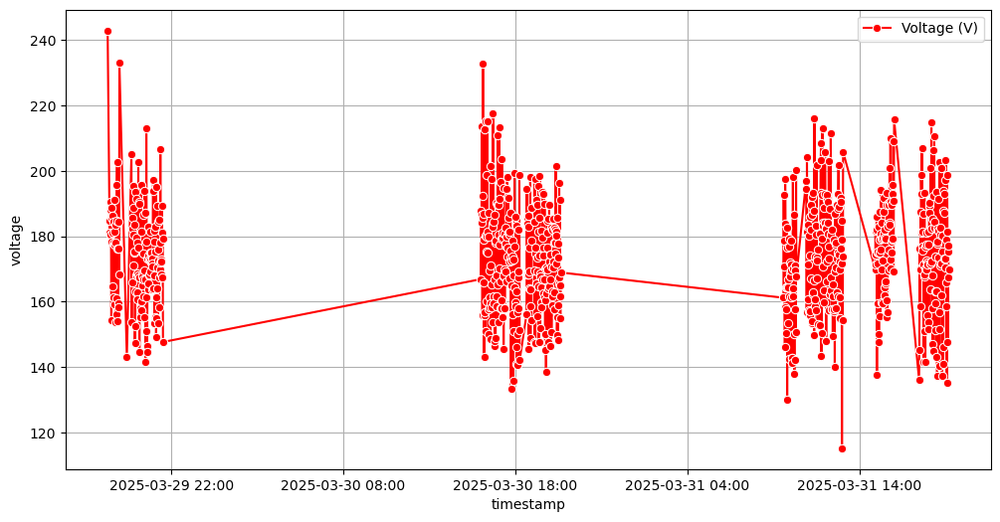

In [ ]:


# Convert timestamp column to datetime
df["timestamp"] = pd.to_datetime(df["timestamp"])

# Resample data to show AVERAGE voltage per minute
df_resampled = df.resample("1T", on="timestamp").mean()

# Plot the resampled voltage data
plt.figure(figsize=(12, 6))
sns.lineplot(x=df_resampled.index, y=df_resampled["voltage"], marker="o", color="red", label="Voltage (V)")

## Format x-axis to show better time labels
plt.gca().xaxis.set_major_formatter(plt.matplotlib.dates.DateFormatter('%Y-%m-%d %H:%M'))  # Custom format
plt.gca().xaxis.set_major_locator(plt.matplotlib.dates.HourLocator(interval=10))  # Show every 10 hours
plt.legend()
plt.grid()


#  

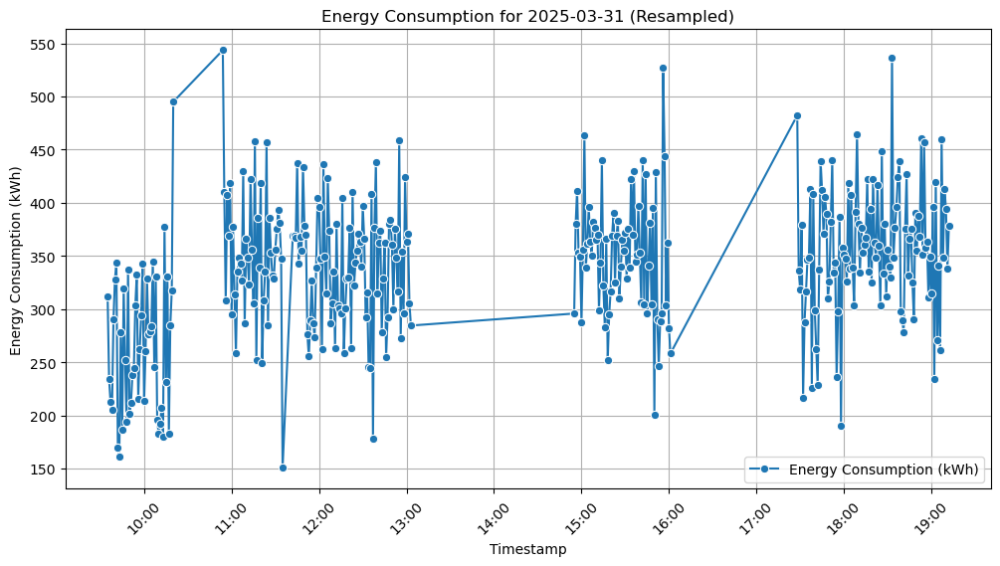

In [30]:




# Check if timestamp has timezone
if df["timestamp"].dt.tz is not None:
    # Get current date in the same timezone
    today = pd.Timestamp.now(tz=df["timestamp"].dt.tz).normalize()
else:
    today = pd.Timestamp.now().normalize()

# Filter data to include only today's entries
df_today = df[df["timestamp"] >= today]

# Sort by timestamp
df_today = df_today.sort_values("timestamp")

# Resample data to show average energy consumption per minute
df_resampled = df_today.resample("1T", on="timestamp").mean()

# Drop NaN values caused by resampling
df_resampled = df_resampled.dropna()

# Plot
plt.figure(figsize=(12, 6))
sns.lineplot(x=df_resampled.index, y=df_resampled["energy_consumption_kWh"], marker="o", label="Energy Consumption (kWh)")

plt.xlabel("Timestamp")
plt.ylabel("Energy Consumption (kWh)")
plt.title(f"Energy Consumption for {today.date()} (Resampled)")
plt.xticks(rotation=45)

# Format x-axis to show only time
plt.gca().xaxis.set_major_formatter(plt.matplotlib.dates.DateFormatter('%H:%M'))
plt.gca().xaxis.set_major_locator(plt.matplotlib.dates.HourLocator(interval=1))
plt.legend()
plt.grid()

# Show plot
plt.show()


In [19]:
from flask import Flask
from flask_socketio import SocketIO
import dash
from dash import dcc, html, Input, Output
import dash_bootstrap_components as dbc
import pandas as pd
import datetime
import plotly.graph_objects as go
import requests
import numpy as np
from pymongo import MongoClient
import openai  # Import OpenAI for AI-powered insights

In [21]:
from flask import Flask
from flask_socketio import SocketIO
import dash
from dash import dcc, html, Input, Output
import dash_bootstrap_components as dbc
import pandas as pd
import datetime
import plotly.graph_objects as go
import requests
import numpy as np
import io
from pymongo import MongoClient
from dash.dependencies import State

# MongoDB Connection
client = MongoClient("mongodb://localhost:27017/")
db = client["energydb"]
collection = db["sensorData"]

# Flask app setup
server = Flask(__name__)
socketio = SocketIO(server)
app = dash.Dash(__name__, server=server, external_stylesheets=[dbc.themes.BOOTSTRAP])

# Fetch data function with anomaly detection
def fetch_data(start_date=None, end_date=None):
    query = {}
    if start_date and end_date:
        query = {"payload.timestamp": {"$gte": start_date, "$lte": end_date}}
    
    data = list(collection.find(query).sort("payload.timestamp", -1).limit(1000))
    df = pd.DataFrame(data)
    
    if not df.empty:
        df["timestamp"] = pd.to_datetime(df["payload"].apply(lambda x: x["timestamp"]))
        df["energy_kWh"] = df["payload"].apply(lambda x: float(x["energy_consumption_kWh"]))
        df["voltage"] = df["payload"].apply(lambda x: float(x["voltage"]))
        df["cost"] = df["energy_kWh"] * 0.12
        
        # Anomaly Detection
        df["anomaly"] = df["energy_kWh"] > (df["energy_kWh"].mean() + 2 * df["energy_kWh"].std())
    
    return df

# Layout with enhanced features
app.layout = dbc.Container([
    html.H1("⚡ Smart Energy Dashboard", className="text-center"),
    
    # Filters & controls
    dbc.Row([
        dbc.Col(dcc.DatePickerRange(
            id='date-picker',
            start_date=datetime.datetime.now() - datetime.timedelta(days=7),
            end_date=datetime.datetime.now(),
            display_format='YYYY-MM-DD'
        ), width=6),
        dbc.Col(html.Button("Download CSV", id="btn_csv", className="btn btn-primary"), width=3),
        dbc.Col(html.Button("Download PDF", id="btn_pdf", className="btn btn-danger"), width=3)
    ], className="mb-4"),
    
    # Alerts
    dbc.Row([dbc.Col(html.Div(id="alert-panel", className="alert alert-warning"), width=12)]),
    
    # Graphs
    dbc.Row([dbc.Col(dcc.Graph(id="energy-graph"), width=12)]),
    
    # Real-time updates
    dcc.Interval(id="interval-component", interval=5000, n_intervals=0),
    
    # Download components
    dcc.Download(id="download-dataframe-csv"),
    dcc.Download(id="download-dataframe-pdf"),
])

# Callback to update graph & alerts
@app.callback(
    Output("energy-graph", "figure"),
    Output("alert-panel", "children"),
    Input("interval-component", "n_intervals"),
    Input("date-picker", "start_date"),
    Input("date-picker", "end_date")
)
def update_dashboard(n, start_date, end_date):
    df = fetch_data(start_date, end_date)
    if df.empty:
        return go.Figure(), "No Data Available"
    
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=df["timestamp"], y=df["energy_kWh"], mode="lines", name="Energy (kWh)", line=dict(color="blue")))
    fig.add_trace(go.Scatter(x=df["timestamp"], y=df["voltage"], mode="lines", name="Voltage", line=dict(color="red")))
    
    anomalies = df[df["anomaly"]]
    fig.add_trace(go.Scatter(x=anomalies["timestamp"], y=anomalies["energy_kWh"], mode="markers", name="Anomalies", marker=dict(color="orange", size=10)))
    
    fig.update_layout(title="Energy Consumption Over Time", template="plotly_dark")
    
    alert_msg = ""
    if (df["energy_kWh"].max() > 500):
        alert_msg += "⚠️ High Energy Consumption Detected! "
    if (df["voltage"].max() > 250 or df["voltage"].min() < 10):
        alert_msg += "⚡ Voltage Fluctuation Warning! "
    
    return fig, alert_msg or "System Operating Normally."

# Callback for CSV download
@app.callback(
    Output("download-dataframe-csv", "data"),
    Input("btn_csv", "n_clicks"),
    prevent_initial_call=True
)
def download_csv(n_clicks):
    df = fetch_data()
    return dcc.send_data_frame(df.to_csv, "energy_data.csv")

# Callback for PDF download
@app.callback(
    Output("download-dataframe-pdf", "data"),
    Input("btn_pdf", "n_clicks"),
    prevent_initial_call=True
)
def download_pdf(n_clicks):
    df = fetch_data()
    buffer = io.BytesIO()
    pdf_text = f"Smart Energy Consumption Report\nTotal Energy: {df['energy_kWh'].sum():.2f} kWh\nEstimated Cost: ${df['cost'].sum():.2f}"
    buffer.write(pdf_text.encode("utf-8"))
    buffer.seek(0)
    return dcc.send_bytes(buffer.getvalue(), "energy_report.pdf")

if __name__ == "__main__":
    app.run(debug=True, port=8070)
